# Importarea bibliotecilor

In [ ]:
# # Importarea bibliotecilor
!pip install numpy pandas matplotlib seaborn scikit-learn pydicom monai

In [ ]:
import numpy as np
import torch
import tempfile
import matplotlib.pyplot as plt
from torch.utils.data import Dataset
from torchvision import transforms, utils
from torch.utils.data import DataLoader
import pandas as pd
import torch.nn as nn
import pydicom
import math
import cv2
import glob
import os
import random
from natsort import natsorted
from sklearn.model_selection import train_test_split
from monai.metrics import ROCAUCMetric
from torch.utils.tensorboard import SummaryWriter
from matplotlib.gridspec import GridSpec
import albumentations as A
from monai.apps import download_and_extract
from monai.config import print_config
from monai.data import decollate_batch, DataLoader
from monai.metrics import ROCAUCMetric
from tqdm import tqdm
from monai.networks.nets import DenseNet121
from monai.transforms import (
    Activations,
    EnsureChannelFirst,
    AsDiscrete,
    Compose,
    LoadImage,
    EnsureTyped,
    ScaleIntensity,
    Resize,
    ToTensor
)
from monai.utils import set_determinism




In [ ]:
# Setăm variabila de mediu MONAI_DATA_DIRECTORY
os.environ["MONAI_DATA_DIRECTORY"] = "MONAI"

# Verificăm că variabila a fost setată corect
directory = os.environ.get("MONAI_DATA_DIRECTORY")
if directory is not None:
    os.makedirs(directory, exist_ok=True)
root_dir = tempfile.mkdtemp() if directory is None else directory


In [45]:
!unzip dataset.zip


Archive:  dataset.zip
replace dataset/Testing.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# 1.Implementarea clasei personalizate

### Aici am aplicat diferite operatii de preprocesare si de normalizare pentru cerintele 5 si 6

In [46]:
class MRI_classification(Dataset):

   def __init__(self, df, title_list, labels, batch_size, transform):
      self.df = df
      self.title_list = title_list
      self.labels = list(labels)
      self.batch_size = batch_size
      self.transform = transform

   def plot_multiple_img(self, images, titles, nrows, ncols, main_title):

      # Make space for images and title
      fig = plt.figure(figsize=(3 * ncols, 3 * nrows + 2))
      for i, img in enumerate(images):
         if i >= nrows * ncols:
            break
         output = fig.add_subplot(nrows, ncols, i+1)
         plt.imshow(img,cmap = 'gray')
         plt.axis('off')
         if (len(titles) > 0) and i < len(titles):
            output.set_title(titles[i], fontsize=10)

      plt.tight_layout()
      plt.suptitle(main_title)
      plt.show()
      plt.close(fig)

   # Schimba luminozitatea
   def change_brightness(self, batch, nr_rows, nr_cols):
      brightness_batch = []
      for image in batch:
            # Adjust brightness
            bright_image = cv2.convertScaleAbs(image, alpha=1, beta=35)
            brightness_batch.append(bright_image)

      self.plot_multiple_img(brightness_batch, self.title_list,nr_rows, nr_cols, main_title="Images after Brightness Adjustment")
      return brightness_batch

   # Aplică filtrul Gaussian pentru a reduce zgomotul
   def apply_gaussian_blur(self,batch,nr_rows, nr_cols):
      gaussian_batch = []
      for image in batch:
         blurred_image = cv2.GaussianBlur(image, (5, 5), 2, cv2.BORDER_DEFAULT)
         blurred_image = np.clip(blurred_image, 0, 256).astype(np.uint8)
         gaussian_batch.append(blurred_image)

      self.plot_multiple_img(gaussian_batch,self.title_list, nr_rows, nr_cols, main_title="Images after Gaussian filter")
      return gaussian_batch

   # Aplică CLAHE pentru a îmbunătăți contrastul
   def apply_clahe(self,batch,nr_rows, nr_cols):
      clahe_batch = []
      transform = A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8 ), always_apply=True, p=1.0)
      for image in batch:
         transformed = transform(image=image)
         clahe_image = np.clip(transformed['image'], 0, 256).astype(np.uint8)
         clahe_batch.append(transformed['image'])

      self.plot_multiple_img(clahe_batch, self.title_list, nr_rows, nr_cols, main_title="Images after Clahe")
      return clahe_batch

   # Aplică filtrul Sobel pentru detectarea marginilor
   def apply_sobel(self,batch ,nr_rows, nr_cols):
      sobel_batch = []
      for image in batch:
         grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
         grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
         sobel_image = cv2.magnitude(grad_x, grad_y)
         sobel_image = np.clip(sobel_image, 0, 256).astype(np.uint8)
         sobel_batch.append(sobel_image)

      self.plot_multiple_img(sobel_batch, self.title_list, nr_rows, nr_cols, main_title="Images after Sobel")
      return sobel_batch

   def apply_canny(self,batch,titles,nr_rows, nr_cols):
      canny_batch = []
      for image in batch:
         edges = cv2.Canny(image, 80, 100)
         canny_batch.append(edges)

      self.plot_multiple_img(canny_batch ,self.title_list, nr_rows, nr_cols, main_title="Images after Canny")
      return canny_batch

   # Normalizează imaginea între 0 și 256
   def normalize_image(self,batch,nr_rows, nr_cols):
      normalized_batch = []
      for image in batch:
         normalized = cv2.normalize(image, None, 0, 256, norm_type=cv2.NORM_MINMAX)
         normalized_uint8 = np.clip(normalized, 0, 256).astype(np.uint8)
         normalized_batch.append(normalized)

      self.plot_multiple_img(normalized_batch, self.title_list, nr_rows, nr_cols, main_title="Images after Normalization")
      return normalized_batch

   # Aplică threshold pentru a păstra doar marginile importante
   def apply_threshold(self,batch,nr_rows, nr_cols):
      thresholded_batch = []
      for image in batch:
         _, thresholded_image = cv2.threshold(image, 80, 256, cv2.THRESH_BINARY)
         thresholded_image = np.clip(thresholded_image, 0, 256).astype(np.uint8)
         thresholded_batch.append(thresholded_image)

      self.plot_multiple_img(thresholded_batch,self.title_list, nr_rows, nr_cols, main_title="Images after Thresholding")
      return thresholded_batch

   def transformations(self,data_frame):

      batch = []
      target_size=(256, 256)

      # Check if all images have the same number of channels and same dimensions
      for image in data_frame:
         if len(image.shape) != 2:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
         img_height, img_width = image.shape[:2]
         if img_height != target_size[0] or img_width != target_size[1]:
            image = cv2.resize(image, target_size)
         batch.append(image)

      nr_images = len(batch)
      nr_cols = math.ceil(nr_images/2)
      nr_rows = math.ceil(nr_images / nr_cols)
      brightness_batch = self.change_brightness(batch,nr_rows,nr_cols)
      gaussian_batch = self.apply_gaussian_blur(brightness_batch,nr_rows,nr_cols)
      clahe_batch = self.apply_clahe(gaussian_batch,nr_rows,nr_cols)
      # sobel_batch = self.apply_sobel(clahe_batch,nr_rows,nr_cols)
      normalized_batch = self.normalize_image(clahe_batch,nr_rows,nr_cols)
      # thresholded_batch = self.apply_threshold(normalized_batch,nr_rows,nr_cols)

      return normalized_batch

   def __len__(self):
      return len(self.df)

   def __getitem__(self, idx):
      # The function splits the images into batches for future function calls
      start_index = idx
      end_index = start_index + self.batch_size
      batch = self.df.iloc[start_index:end_index]
      batch_labels = self.labels[start_index:end_index]
      batch_titles = self.title_list[start_index:end_index]
      num_images = len(batch)
      if(num_images !=0):
         num_cols = math.ceil(num_images/2)
         num_rows = math.ceil(num_images / num_cols)

      batch_images = [] # possible problem
      for path in batch['Image_path']:
         image = cv2.imread(path)
         if image is not None:
            batch_images.append(image)

      # Display each image with the filename as title
      self.plot_multiple_img(batch_images, batch_titles, num_rows, num_cols, main_title="Original Images")

      if self.transform:
         batch_images = self.transformations(batch_images)
         self.plot_multiple_img(batch_images, batch_titles, num_rows, num_cols, main_title="Final Images")
      return batch_images, batch_labels


# Preparing datasets

In [47]:
column_names = ["Image_path", "Title", "Tumor_type","Label"]
df_train = pd.DataFrame(columns = column_names)
df_train['Image_path'] = natsorted(glob.glob('./dataset/Training/**/*.jpg'))


for ind in df_train.index:
    # Add label
    title = df_train.loc[ind]['Image_path']
    df_train.loc[ind, 'Title'] = os.path.basename(title).split('/')[-1]

    # Add tumor type
    if "glioma" in df_train.loc[ind, 'Image_path']:
        df_train.loc[ind, 'Tumor_type'] = "glioma"
        df_train.loc[ind, 'Label'] = 0
    elif "meningioma" in df_train.loc[ind, 'Image_path']:
        df_train.loc[ind, 'Tumor_type'] = "meningioma"
        df_train.loc[ind, 'Label'] = 1
    elif "pituitary" in df_train.loc[ind, 'Image_path']:
        df_train.loc[ind, 'Tumor_type'] = "pituitary"
        df_train.loc[ind, 'Label'] = 2
    elif "no_tumor" in df_train.loc[ind, 'Image_path']:
        df_train.loc[ind, 'Tumor_type'] = "no_tumor"
        df_train.loc[ind, 'Label'] = 3



test_df = pd.DataFrame(columns = column_names)
test_df['Image_path'] = natsorted(glob.glob('./dataset/Testing/**/*.jpg'))

for ind in test_df.index:

    # Add label
    title = test_df.loc[ind]['Image_path']
    test_df.loc[ind, 'Title'] = os.path.basename(title).split('/')[-1]

    # Add tumor type
    if "glioma" in test_df.loc[ind, 'Image_path']:
        test_df.loc[ind, 'Tumor_type'] = "glioma"
        test_df.loc[ind,'Label'] = 0
    elif "meningioma" in test_df.loc[ind, 'Image_path']:
        test_df.loc[ind, 'Tumor_type'] = "meningioma"
        test_df.loc[ind,'Label'] = 1
    elif "pituitary" in test_df.loc[ind, 'Image_path']:
        test_df.loc[ind, 'Tumor_type'] = "pituitary"
        test_df.loc[ind,'Label'] = 2
    elif "no_tumor" in test_df.loc[ind, 'Image_path']:
        test_df.loc[ind, 'Tumor_type'] = "no_tumor"
        test_df.loc[ind,'Label'] = 3

train_labels = df_train['Label'].tolist()
train_titles = df_train['Title'].tolist()


# Split dataset

In [48]:
train_df, validation_df = natsorted(train_test_split(df_train, test_size=0.2, random_state=1,shuffle=True))
train_df = train_df.loc[natsorted(train_df.index, key=lambda x: train_df.loc[x, 'Title'])]
validation_df = validation_df.loc[natsorted(validation_df.index, key=lambda x: validation_df.loc[x, 'Title'])]
print(f"\nSetul de antrenare are {len(train_df)} imagini.")
print(f"Setul de validare are {len(validation_df)} imagini.")
print(f"Setul de testare are {len(test_df)} imagini.")



Setul de antrenare are 2296 imagini.
Setul de validare are 574 imagini.
Setul de testare are 394 imagini.


# Data Visualization

### Pentru training set

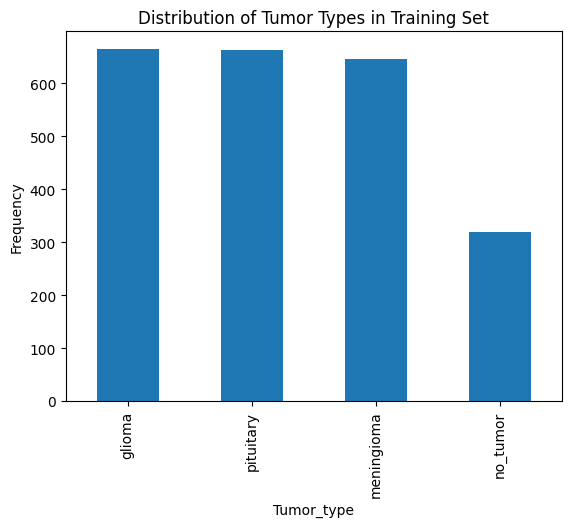

In [49]:
train_df['Tumor_type'].value_counts().plot(kind = 'bar')
plt.title('Distribution of Tumor Types in Training Set')
plt.ylabel('Frequency')
plt.show()

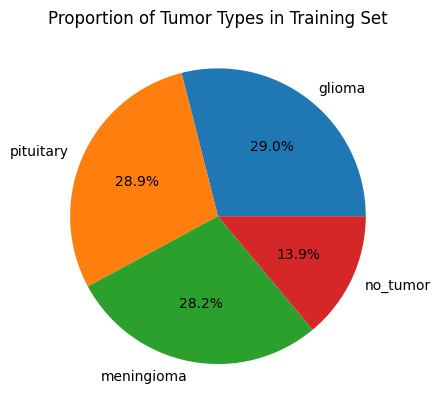

In [50]:
train_df['Tumor_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.ylabel('')  # Erase label
plt.title('Proportion of Tumor Types in Training Set')
plt.show()

### Pentru testing set

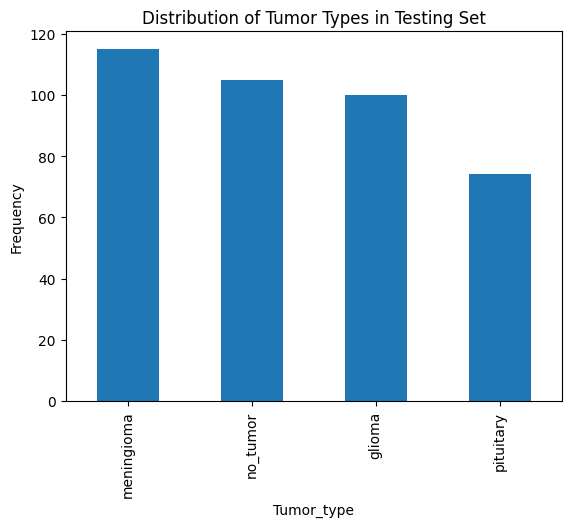

In [51]:
test_df['Tumor_type'].value_counts().plot(kind = 'bar')
plt.title('Distribution of Tumor Types in Testing Set')
plt.ylabel('Frequency')
plt.show()

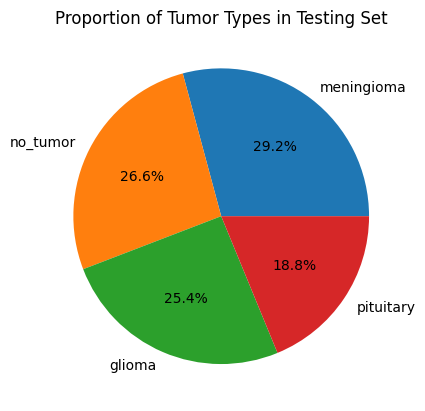

In [52]:
test_df['Tumor_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.ylabel('')  # Erase label
plt.title('Proportion of Tumor Types in Testing Set')
plt.show()

### Pentru validation set

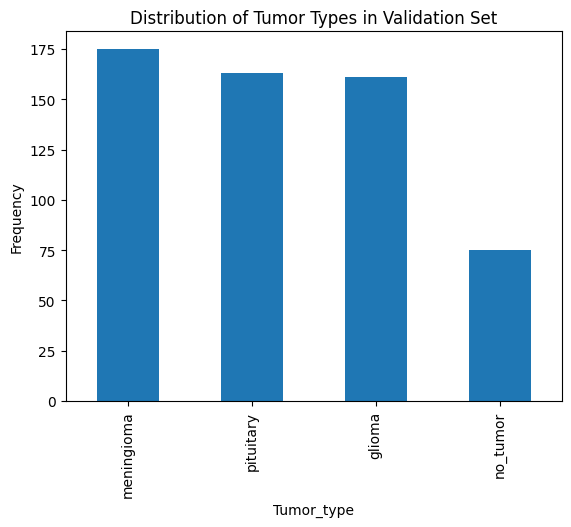

In [53]:
validation_df['Tumor_type'].value_counts().plot(kind = 'bar')
plt.title('Distribution of Tumor Types in Validation Set')
plt.ylabel('Frequency')
plt.show()

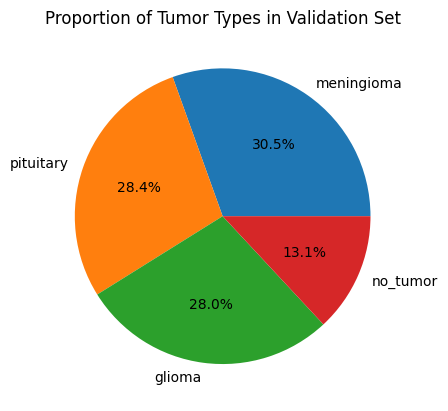

In [54]:
validation_df['Tumor_type'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.ylabel('')  # Erase label
plt.title('Proportion of Tumor Types in Validation Set')
plt.show()

# Detailed images visualization

In [55]:
batch_size = 10
glioma_df = df_train.loc[df_train['Tumor_type'] == 'glioma'].iloc[:batch_size]
glioma_labels = glioma_df['Label'].tolist()
glioma_titles = glioma_df['Title'].tolist()
meningioma_df = df_train.loc[df_train['Tumor_type'] == 'meningioma'].iloc[:batch_size]
meningioma_labels = meningioma_df['Label'].tolist()
meningioma_titles = meningioma_df['Title'].tolist()
pituitary_df = df_train.loc[df_train['Tumor_type'] == 'pituitary'].iloc[:batch_size]
pituitary_labels = pituitary_df['Label'].tolist()
pituitary_titles = pituitary_df["Title"].tolist()
no_tumor_df = df_train.loc[df_train['Tumor_type'] == 'no_tumor'].iloc[:batch_size]
no_tumor_labels = no_tumor_df['Label'].tolist()
no_tumor_titles = no_tumor_df["Title"].tolist()



### For glioma tumors


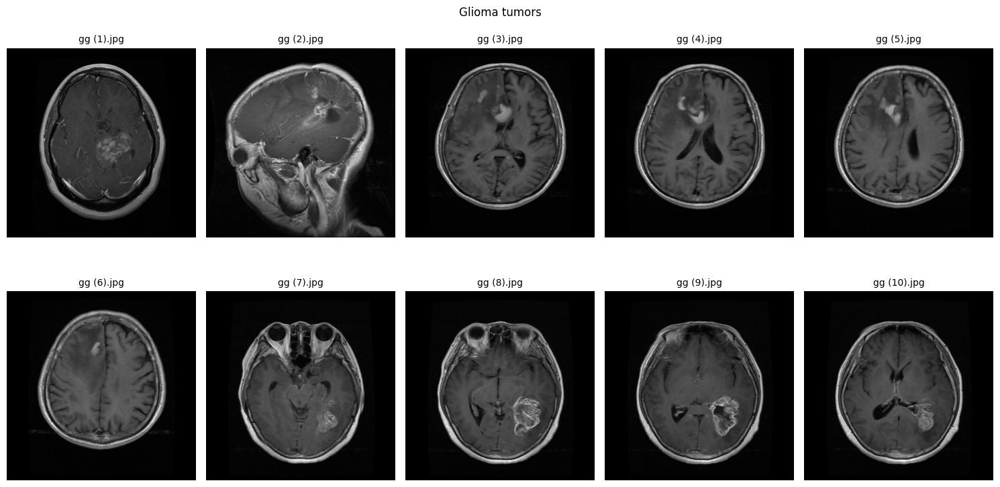

In [56]:
glioma_list = []
for path in glioma_df['Image_path']:
    image = cv2.imread(path)
    if image is not None:
        glioma_list.append(image)

glioma_dataset = MRI_classification(glioma_df, glioma_titles, glioma_labels, 10, transform=True)
glioma_dataset.plot_multiple_img(glioma_list,glioma_titles,2,5, "Glioma tumors")

### For meningioma tumors


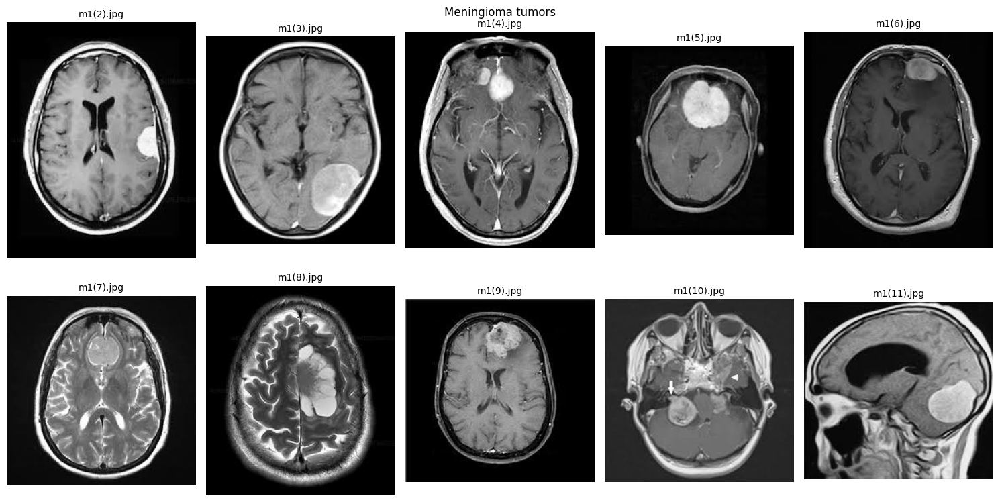

In [57]:
meningioma_list = []
for path in meningioma_df['Image_path']:
    img = cv2.imread(path)
    if img is not None:
        meningioma_list.append(img)

meningioma_dataset = MRI_classification(meningioma_df, meningioma_titles, meningioma_labels, 10, transform=True)
meningioma_dataset.plot_multiple_img(meningioma_list,meningioma_titles, 2,5, "Meningioma tumors")

### For pituitary tumors


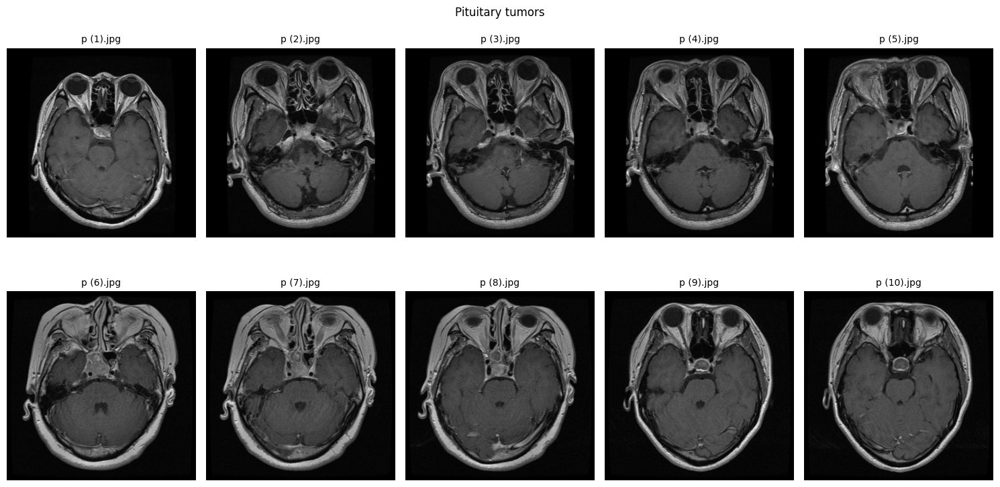

In [58]:
pituitary_list = []
for path in pituitary_df['Image_path']:
    img = cv2.imread(path)
    if img is not None:
        pituitary_list.append(img)

pituitary_dataset = MRI_classification(pituitary_df, pituitary_titles, pituitary_labels, 10, transform=True)
pituitary_dataset.plot_multiple_img(pituitary_list,pituitary_titles, 2, 5, "Pituitary tumors")

### For no tumors


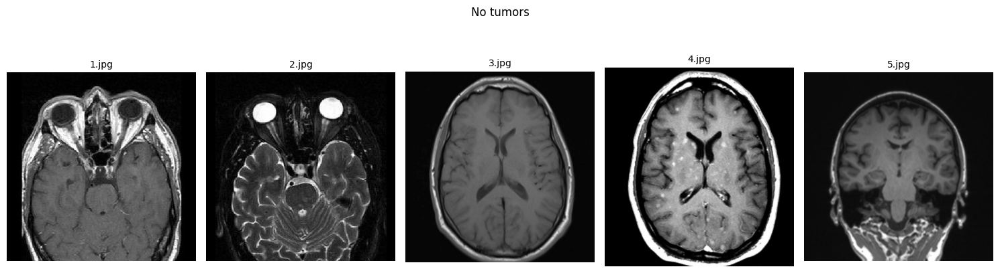

In [59]:
no_tumor_list = []
for path in no_tumor_df['Image_path']:
    img = cv2.imread(path)
    if img is not None:
        no_tumor_list.append(img)

no_tumor_dataset = MRI_classification(no_tumor_df, no_tumor_titles,no_tumor_labels, 5, transform=True)
no_tumor_dataset.plot_multiple_img(no_tumor_list, no_tumor_titles,1, 5, "No tumors")

# Preprocessing techniques


In [60]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
train_dataset = MRI_classification(train_df, train_titles, train_labels,batch_size=4, transform=True)
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)


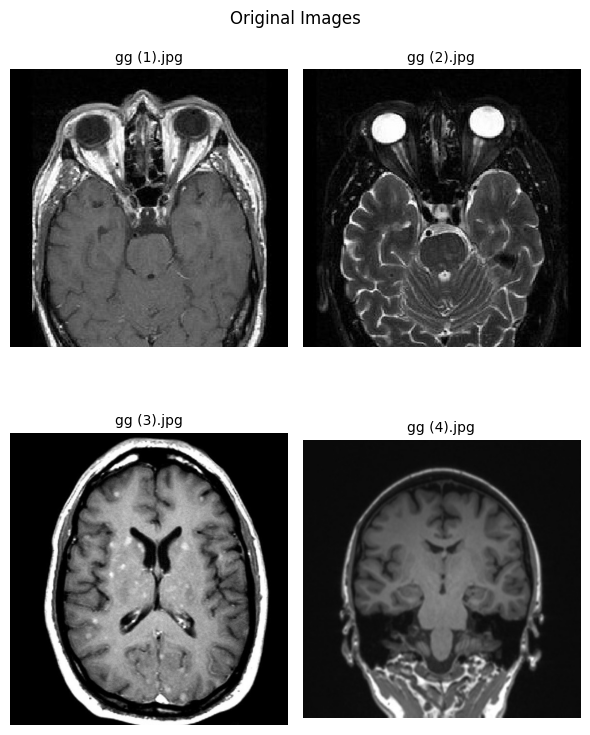

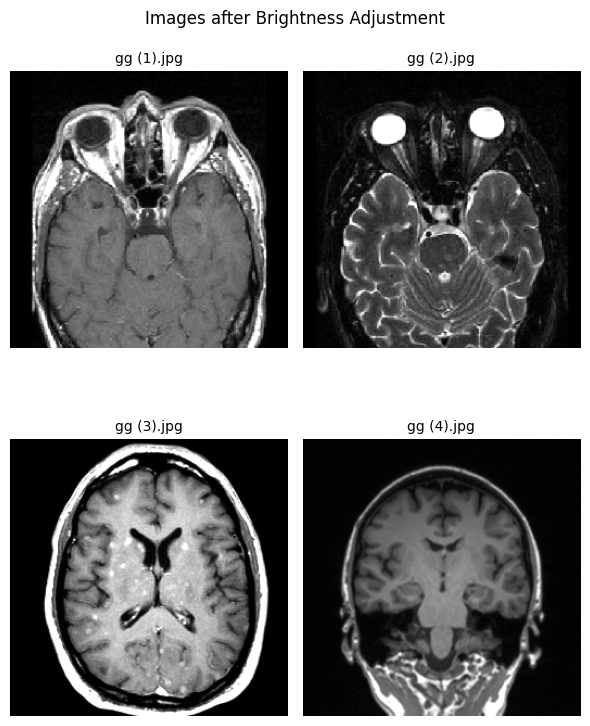

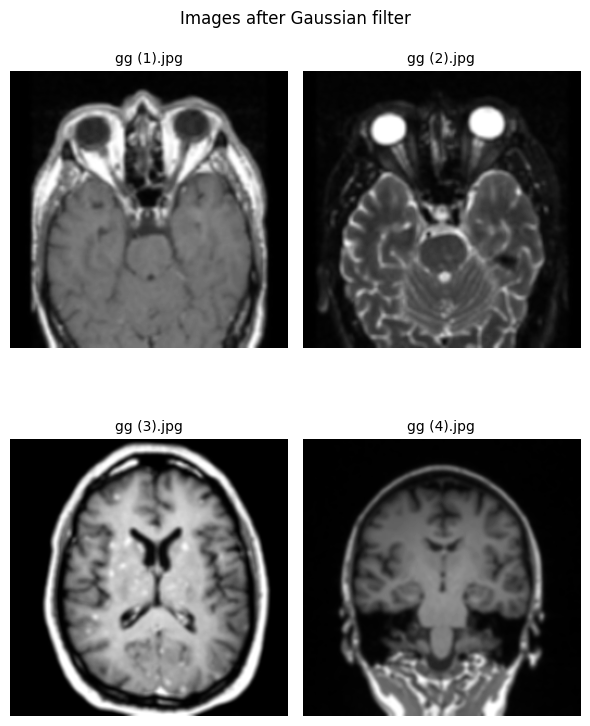

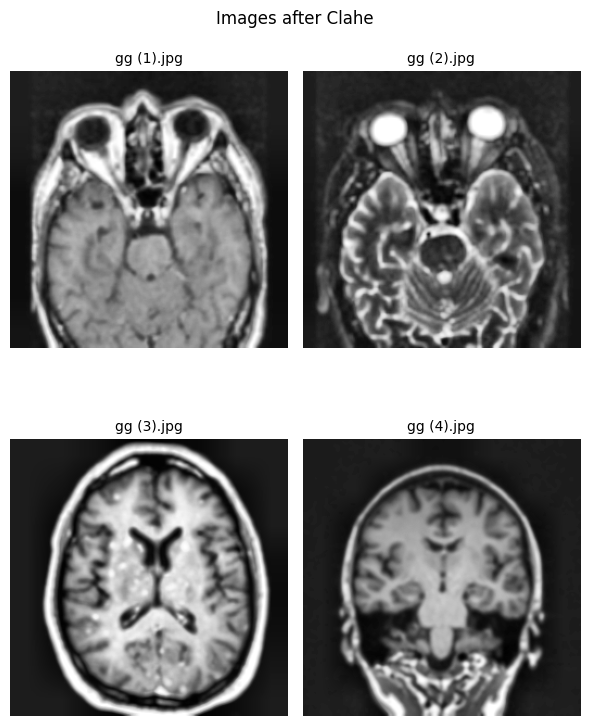

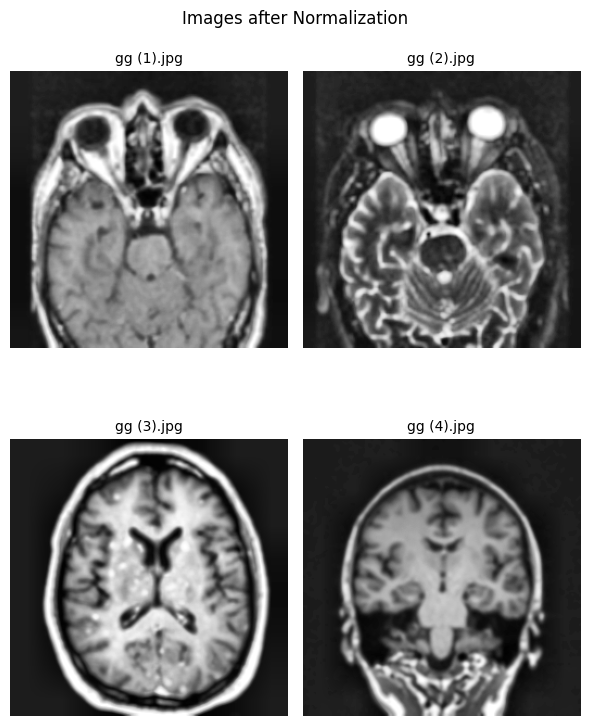

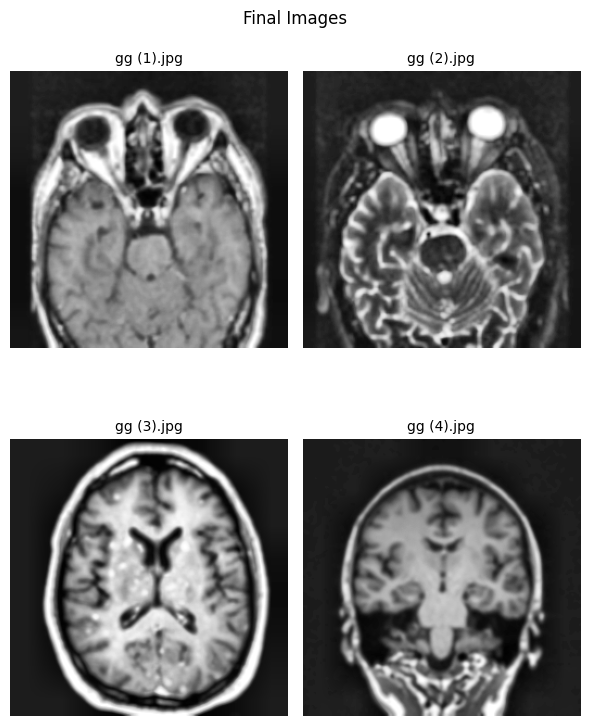

([array([[29, 29, 29, ..., 29, 29, 29],
         [29, 29, 29, ..., 29, 29, 29],
         [29, 29, 29, ..., 29, 29, 29],
         ...,
         [21, 21, 21, ..., 15, 15, 15],
         [21, 21, 21, ..., 15, 15, 15],
         [21, 21, 21, ..., 15, 15, 15]], dtype=uint8),
  array([[29, 29, 29, ..., 29, 29, 29],
         [29, 29, 29, ..., 29, 29, 29],
         [29, 29, 29, ..., 29, 29, 29],
         ...,
         [25, 25, 25, ..., 20, 20, 20],
         [25, 25, 25, ..., 20, 20, 20],
         [25, 25, 25, ..., 20, 20, 20]], dtype=uint8),
  array([[28, 28, 28, ..., 28, 28, 28],
         [28, 28, 28, ..., 28, 28, 28],
         [28, 28, 28, ..., 28, 28, 28],
         ...,
         [28, 28, 28, ..., 28, 28, 28],
         [28, 28, 28, ..., 28, 28, 28],
         [28, 28, 28, ..., 28, 28, 28]], dtype=uint8),
  array([[27, 27, 27, ..., 27, 27, 27],
         [27, 27, 27, ..., 27, 27, 27],
         [27, 27, 27, ..., 27, 27, 27],
         ...,
         [27, 27, 27, ..., 31, 31, 31],
         [27, 27, 2

In [61]:
train_dataset.__getitem__(0)

# Implementarea modelului neural

In [62]:
class LeNet(nn.Module):
    def __init__(self, in_size, out_size):
        super(LeNet, self).__init__()
        self.conv1 = nn.Conv2d(in_size, 8, kernel_size=5, stride=1)
        self.conv2 = nn.Conv2d(8, 8, kernel_size=5, stride=1)
        self.pool = nn.AvgPool2d(kernel_size=2, stride=2)
        self.fc1 = nn.Linear(61*61*8, 64)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, out_size)
        self.relu = nn.ReLU()
        self.flatten = nn.Flatten()

    def forward(self, x):
        # First convolution layer followed by ReLU activation and pooling
        x = self.relu(self.conv1(x))
        x = self.pool(x)
        # print("After conv1 and pool:", x.shape)  # Debugging: check shape

        # Second convolution layer followed by ReLU activation and pooling
        x = self.relu(self.conv2(x))
        x = self.pool(x)
        # print("After conv2 and pool:", x.shape)  # Debugging: check shape

        # Flatten the output
        x = self.flatten(x)
        # print("After flatten:", x.shape)  # Debugging: check shape
        #PROBLEMA E INTRE FLATTEN SI FC1

        # Fully connected layers with ReLU activation
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))

        # Output layer
        x = self.fc3(x)

        return x

    def name(self):
        return "LeNet"

In [63]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f"Using device: {device}")
model = LeNet(1, 4).to(device) # in_size and out_size (types of tumors)
print(model)

LeNet(
  (conv1): Conv2d(1, 8, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(8, 8, kernel_size=(5, 5), stride=(1, 1))
  (pool): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (fc1): Linear(in_features=29768, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=32, bias=True)
  (fc3): Linear(in_features=32, out_features=4, bias=True)
  (relu): ReLU()
  (flatten): Flatten(start_dim=1, end_dim=-1)
)


#  Algoritm de optimizare si funcție de eroare

In [64]:
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
loss_function = nn.CrossEntropyLoss()


In [65]:
train_transforms = Compose(
    [
        LoadImage(image_only=True),
        EnsureChannelFirst(),
        ScaleIntensity(),
        EnsureTyped(keys=["image"], dtype=torch.float32),
        Resize(spatial_size=(256, 256)),
        ToTensor()
    ]
)

val_transforms = Compose(
    [
        LoadImage(image_only=True),
        EnsureChannelFirst(),
        ScaleIntensity(),
        EnsureTyped(keys=["image"], dtype=torch.float32),
        Resize(spatial_size=(256, 256)),
        ToTensor()
    ]
)

y_pred_trans = Compose([Activations(softmax=True)])
y_trans = Compose([AsDiscrete(to_onehot=4)])


----------
epoch 1/1


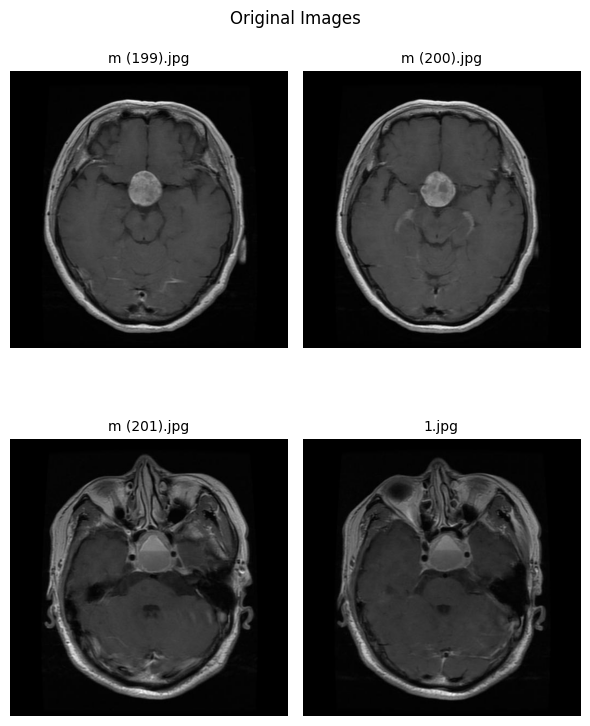

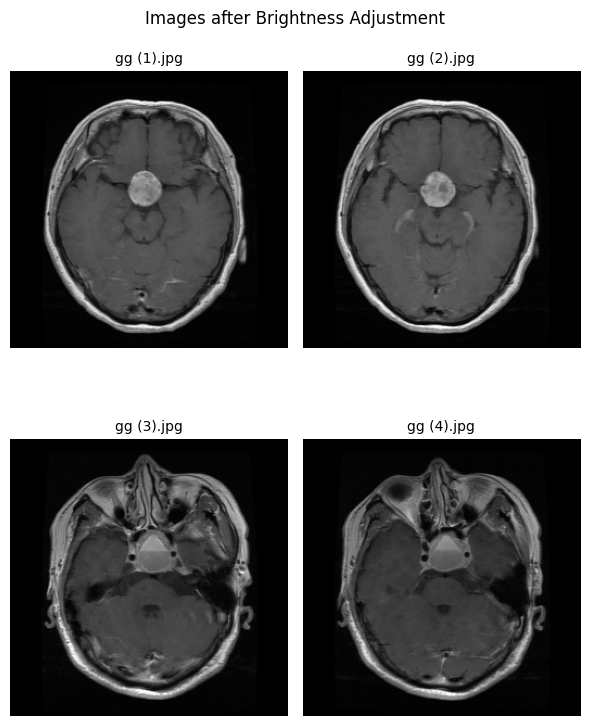

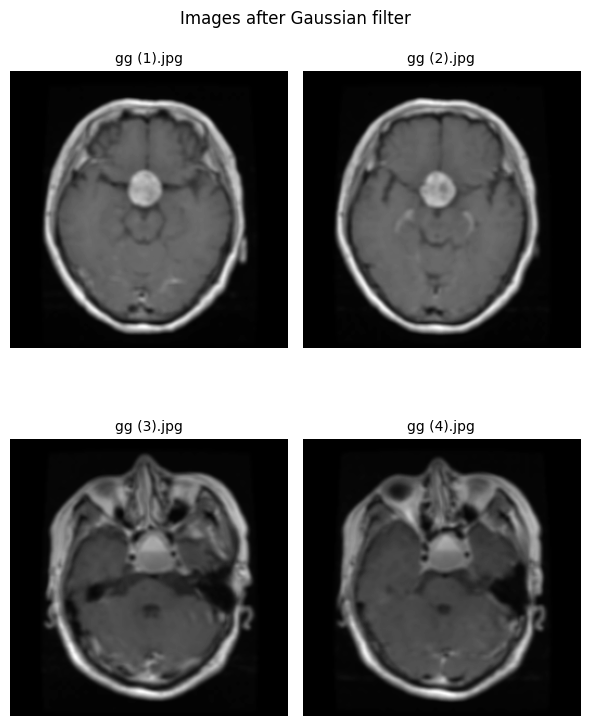

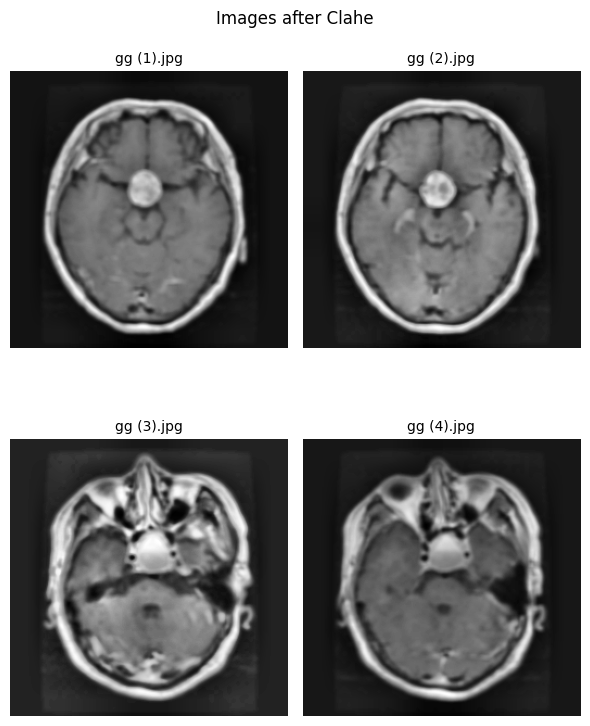

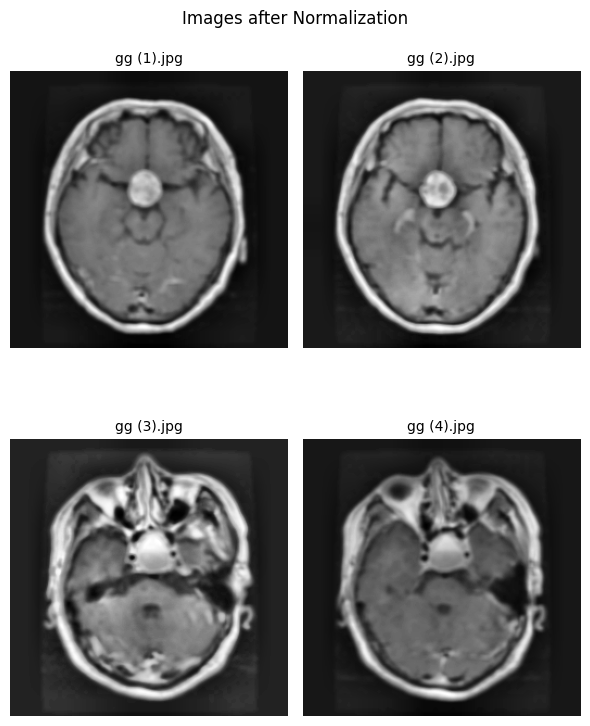

...

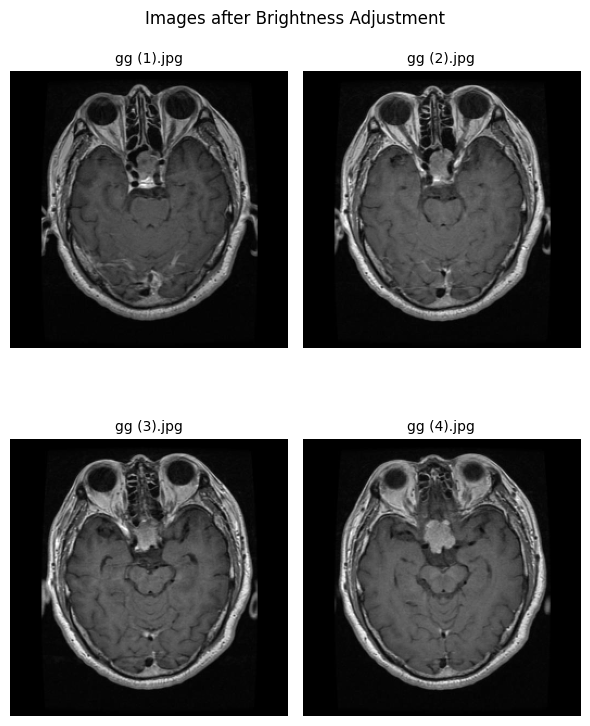

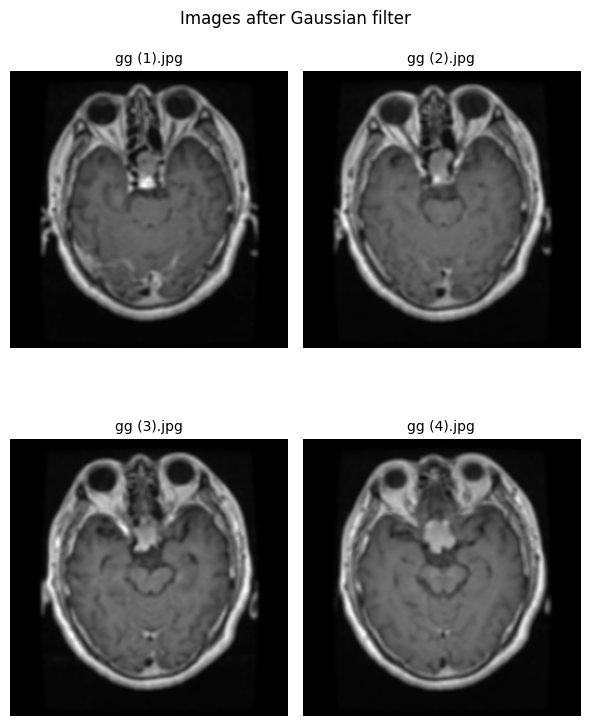

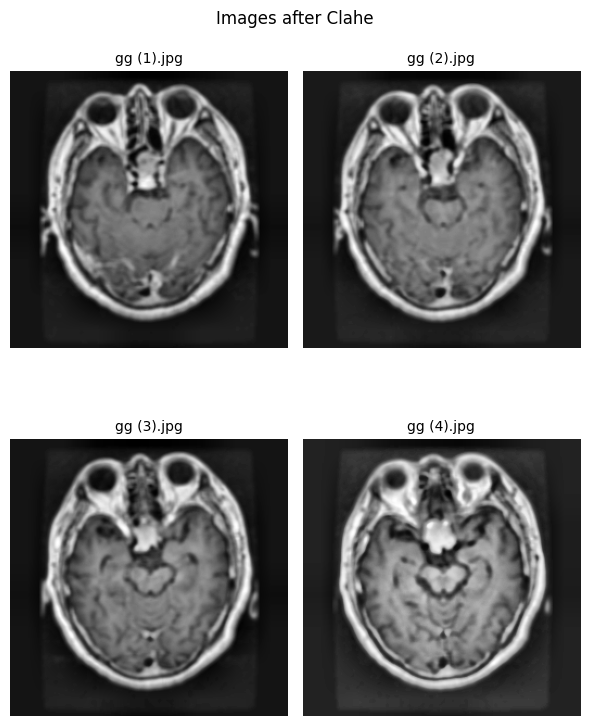

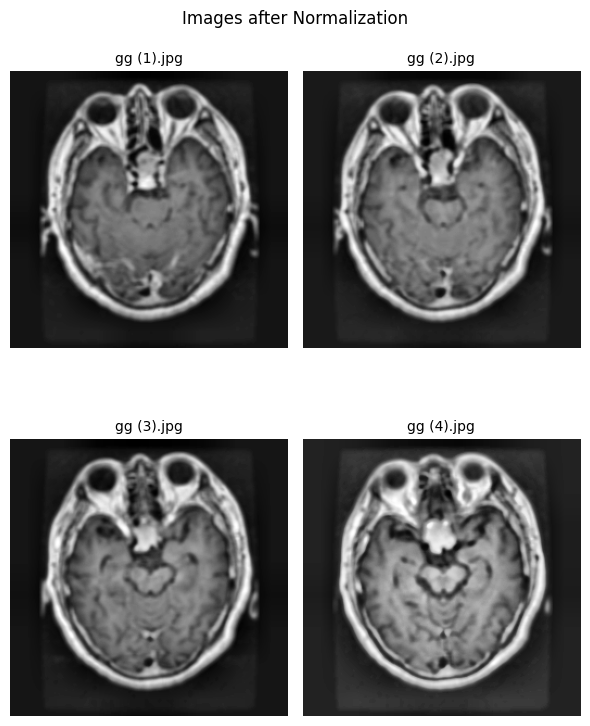

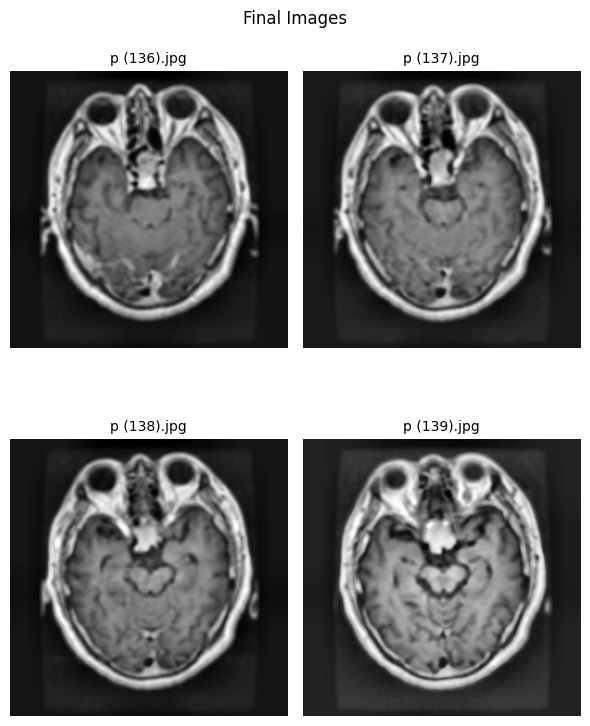

1/574, train_loss: 4.0046


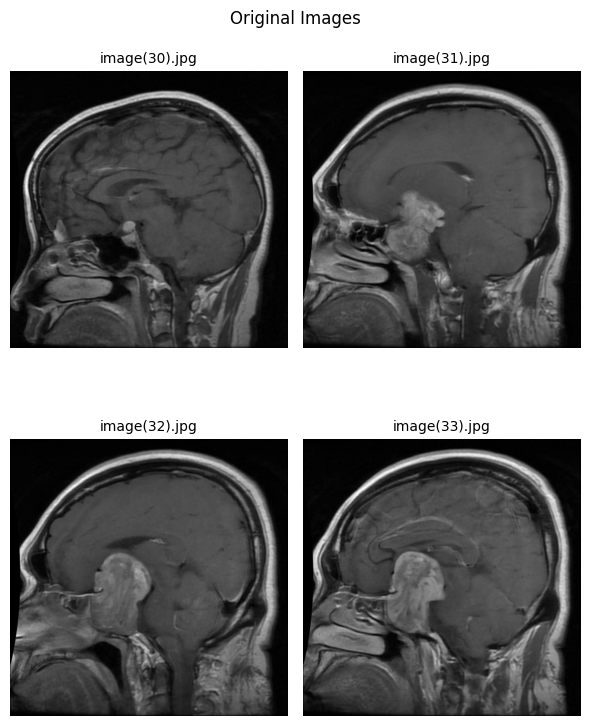

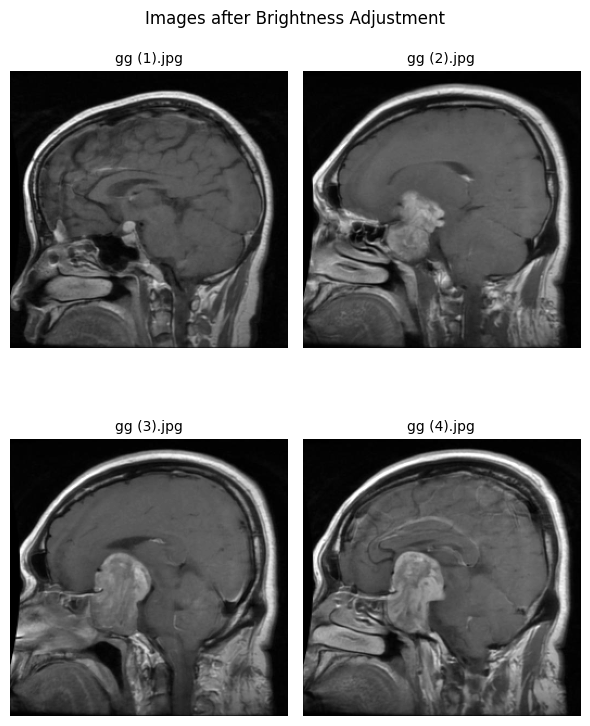

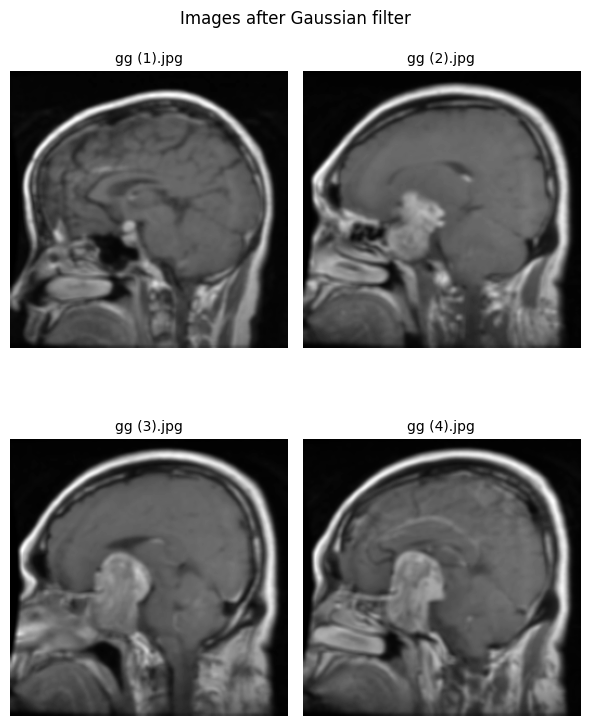

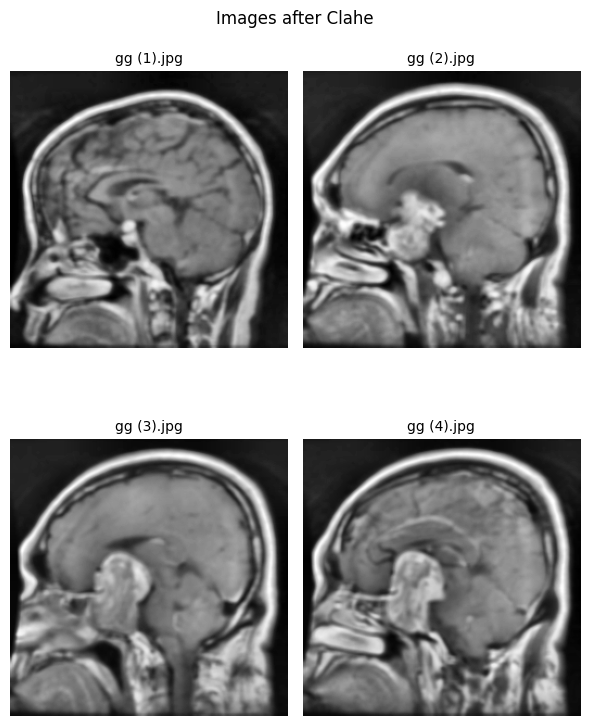

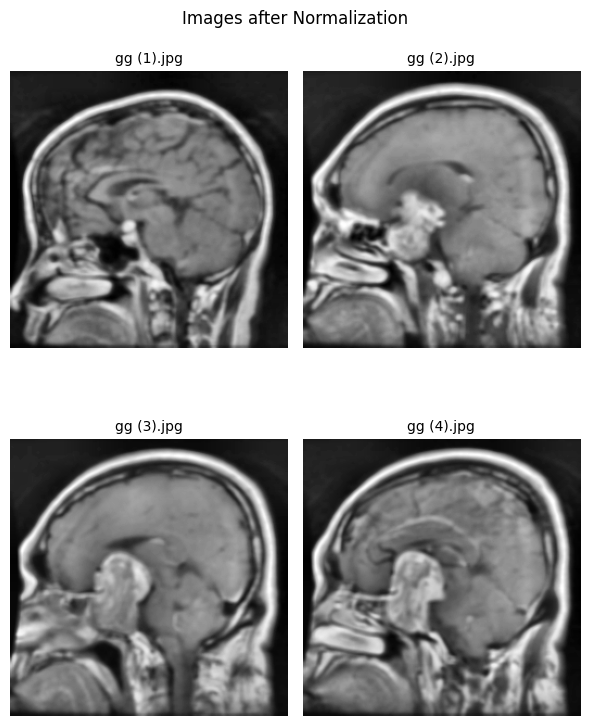

...

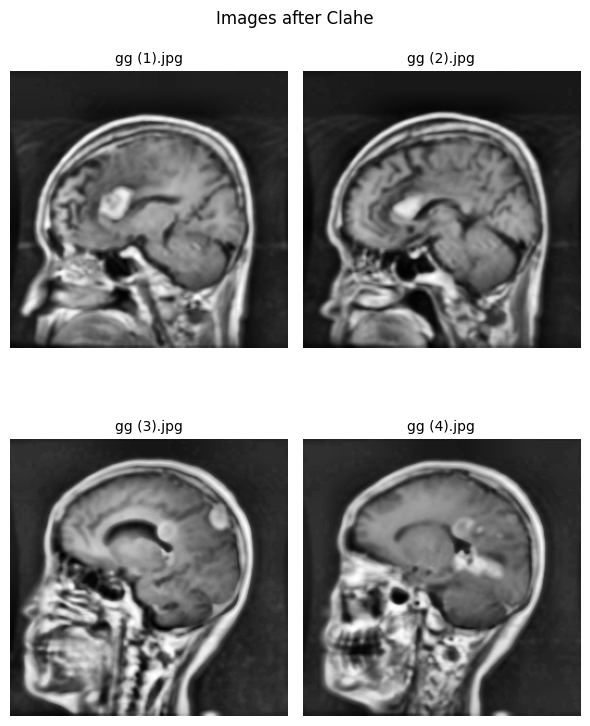

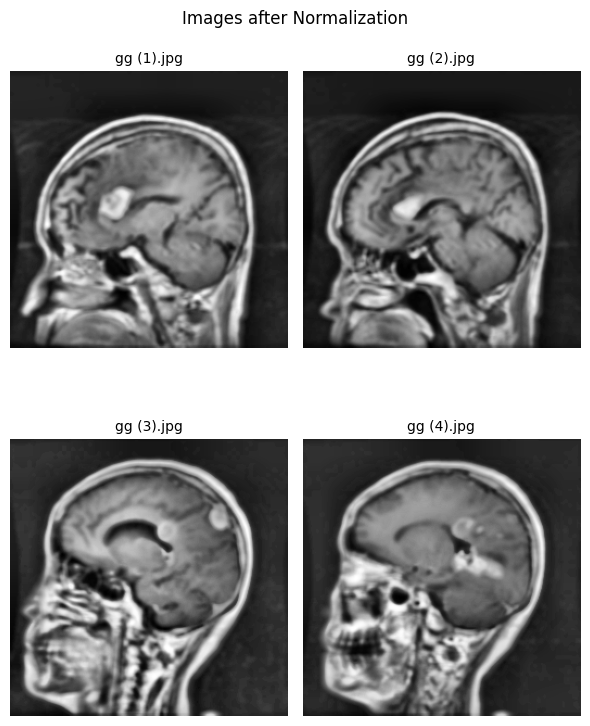

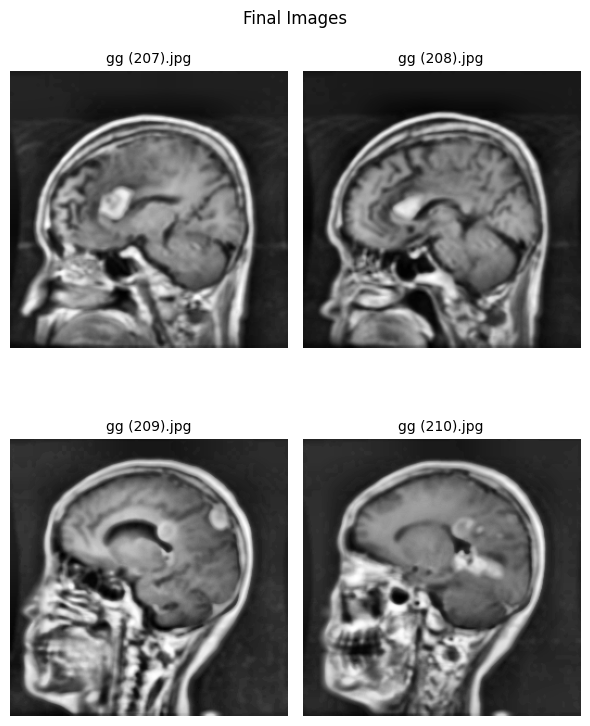

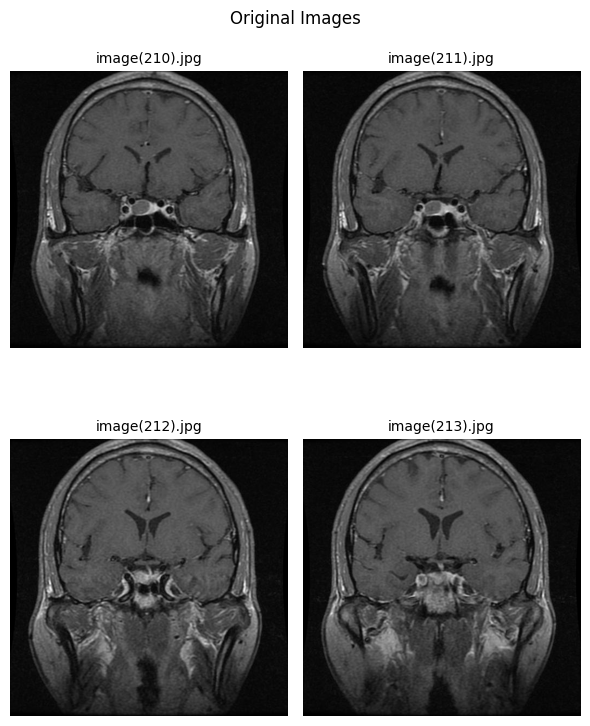

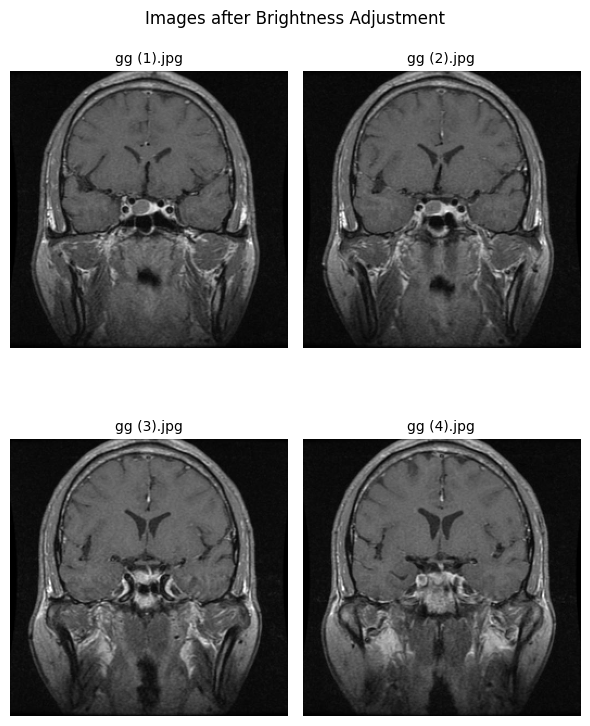

In [ ]:
max_epochs = 1
val_interval = 1
auc_metric = ROCAUCMetric()

best_metric = -1
best_metric_epoch = -1
epoch_loss_values = []
metric_values = []
writer = SummaryWriter()

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data[0][0].to(device), batch_data[1][0].to(device)
        inputs = inputs.unsqueeze(1)
        inputs = inputs.float()  # Convert input to float32
        # print(inputs)
        # print(labels)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = loss_function(outputs, labels.long())
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        print(f"{step}/{len(train_dataset) // train_loader.batch_size}, " f"train_loss: {loss.item():.4f}")
        epoch_len = len(train_dataset) // train_loader.batch_size
        writer.add_scalar("train_loss", loss.item(), epoch_len * epoch + step)
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")
    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            y_pred = torch.tensor([], dtype=torch.float32, device=device)
            y = torch.tensor([], dtype=torch.long, device=device)
            for val_data in train_loader:
                val_images, val_labels = (
                    val_data[0].to(device),
                    val_data[1].to(device),
                )
                y_pred = torch.cat([y_pred, model(val_images)], dim=0)
                y = torch.cat([y, val_labels], dim=0)
            y_onehot = [y_trans(i) for i in decollate_batch(y, detach=False)]
            y_pred_act = [y_pred_trans(i) for i in decollate_batch(y_pred)]
            auc_metric(y_pred_act, y_onehot)
            result = auc_metric.aggregate()
            auc_metric.reset()
            del y_pred_act, y_onehot
            metric_values.append(result)
            acc_value = torch.eq(y_pred.argmax(dim=1), y)
            acc_metric = acc_value.sum().item() / len(acc_value)
            if result > best_metric:
                best_metric = result
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current AUC: {result:.4f}"
                f" current accuracy: {acc_metric:.4f}"
                f" best AUC: {best_metric:.4f}"
                f" at epoch: {best_metric_epoch}"
            )
            writer.add_scalar("val_accuracy", acc_metric, epoch + 1)

print(f"train completed, best_metric: {best_metric:.4f} " f"at epoch: {best_metric_epoch}")
writer.close()



# Evaluarea modelului